In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
from sklearn import metrics
import re
import time
import os
from scipy import stats

import warnings
warnings.filterwarnings("ignore")

import scipy.stats

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score 
from sklearn.model_selection import StratifiedKFold

from sklearn.preprocessing import RobustScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor


from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import classification_report
from sklearn.metrics import mean_squared_error, r2_score

#Quality of image:
%config InlineBackend.figure_format = 'svg'


# Import my own functions from utils file:
import import_ipynb
from utils_home_prices import *

importing Jupyter notebook from utils_home_prices.ipynb


In [2]:
dataDirectory = os.path.join(os.path.dirname(os.getcwd()),'Home_Prices\\data')
imageDirectory = os.path.join(os.path.dirname(os.getcwd()),'Home_Prices\\images\\EDA')

In [3]:
df = pd.read_csv(dataDirectory + "\Melbourne_Tohid.csv")
print(df.shape)
df.head(2)

(27003, 26)


,suburb,address,room,type,price,method,seller,date,distance,postcode,...,lattitude,longtitude,region,count,age,year,season,month,period,history
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,2016-03-12,2.5,3067.0,...,-37.7996,144.9984,Northern Metropolitan,4019,118,2016,Winter,3,2016-03,Old
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,2016-04-02,2.5,3067.0,...,-37.8079,144.9934,Northern Metropolitan,4019,118,2016,Spring,4,2016-04,Old


**Analyzing Price:**<br><br>
**Question1-** Find the median price for each suburb based on year, home type, and room number.<br>

**Question2-** For each record, compare the price with median price.<br>

**Question3-** For bucketized distance from city centre, find zone price based on year, home type, and room number.<br>

**Question4-** For each record, compare the price with median zone price.<br>

**Question5-** For each neighbourhood, check if the price trend for 2-bedrooms units goes up or down.<br>

**Question6-** By considering bucketizing for distance, each bucket includes some neighbourhoods. For distnace zone 1, check how many% of records have price lower than median of zone price?<br>

**Question7-** Suppose that yearly growth rate is defined as "count of transaction in 2017 divided by to 2016". Find the growth rate based on each geographical region and home type.<br>

**Question8-** Find top-10 geographical regions in terms of highest growth rate.<br>

In [4]:
# Answers to Question 1:
prices_df=df.groupby(['suburb','year','type','room'],as_index=False)['price'].median()
prices_df.columns=['suburb','year','type','room','median_price']
prices_df.head(3)

,suburb,year,type,room,median_price
0,Abbotsford,2016,h,2,1100000.0
1,Abbotsford,2016,h,3,1195000.0
2,Abbotsford,2016,h,4,1600000.0


In [5]:
# Answers to Question 2:
df=df.merge(prices_df,on=['suburb','year','type','room'])
df['above_median']=0
df['above_median'] = np.where(df['price']>df['median_price'], 1, df['above_median'])
df[35:38]

,suburb,address,room,type,price,method,seller,date,distance,postcode,...,region,count,age,year,season,month,period,history,median_price,above_median
35,Abbotsford,11/1 Abbott St,3,h,980000.0,S,Biggin,2017-11-18,3.0,3067.0,...,Northern Metropolitan,4019,118,2017,Fall,11,2017-11,Old,1290000.0,0
36,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,2016-04-06,2.5,3067.0,...,Northern Metropolitan,4019,4,2016,Spring,4,2016-04,New,1600000.0,0
37,Abbotsford,22 Park St,4,h,1985000.0,S,Biggin,2016-12-11,2.5,3067.0,...,Northern Metropolitan,4019,118,2016,Fall,12,2016-12,Old,1600000.0,1


**Analyzing Distance:**

In [6]:
bins=[0,5,10,15,20]
df['distance_bins']=np.digitize(df['distance'],bins)
df['distance_bins'].value_counts()

2    9006
3    8909
1    3678
4    2769
5    2641
Name: distance_bins, dtype: int64

In [7]:
# Answers to Question 3:
zone_df=df.groupby(['year','type','room', 'distance_bins'],as_index=False)['price'].median()
zone_df.columns=['year', 'type', 'room', 'distance_bins', 'zone_price']
zone_df.head(3)

,year,type,room,distance_bins,zone_price
0,2016,h,1,1,923250.0
1,2016,h,1,2,696850.0
2,2016,h,1,3,1330000.0


In [8]:
# Answers to Question 4:
df=df.merge(zone_df,on=['year','type','room', 'distance_bins'])
df['above_zone_median']=0
df['above_zone_median'] = np.where(df['price']>df['zone_price'], 1, df['above_zone_median'])

In [9]:
df[46:48]

,suburb,address,room,type,price,method,seller,date,distance,postcode,...,year,season,month,period,history,median_price,above_median,distance_bins,zone_price,above_zone_median
46,Collingwood,20 Emma St,2,h,1015000.0,S,Nelson,2016-08-10,1.6,3066.0,...,2016,Summer,8,2016-08,Old,1000000.0,1,1,1090000.0,0
47,Collingwood,382 Wellington St,2,h,855000.0,S,Jellis,2016-12-11,1.6,3066.0,...,2016,Fall,12,2016-12,Old,1000000.0,0,1,1090000.0,0


In [10]:
# Making a backup:
df2 = df.copy(deep=True)

#df = df2.copy(deep=True)

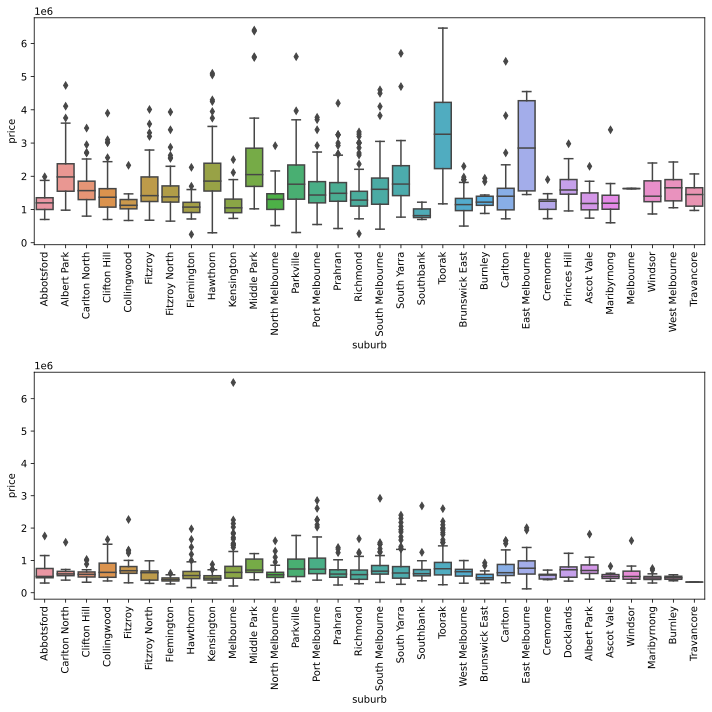

In [11]:
# Variation of home price in a zone with minimum distance from city centre:

innerZoneHouse = df.loc[(df['distance_bins']==1) & (df['type']=='h')]
innerZoneUnit = df.loc[(df['distance_bins']==1) & (df['type']=='u')]

fig, axes = plt.subplots(2,1, figsize=(10,10))

sns.boxplot('suburb', 'price', data=innerZoneHouse, ax=axes[0])
sns.boxplot('suburb', 'price', data=innerZoneUnit, ax=axes[1])
axes[0].tick_params(axis='x', labelrotation=90)
axes[1].tick_params(axis='x', labelrotation=90)

fig.tight_layout()

**Analyzing Price for 2-Bedrooms Unit:**<br><br>
**Question5-** For each neighborhood, check if the price trend for 2-bedrooms units goes up or down.

In [12]:
selected_df=df[(df.type=='u')&(df.room==2)]

temp_df = selected_df.groupby(['suburb','year'],as_index=False).price.median()
print(temp_df.shape)
temp_df.head(3)

(475, 3)


,suburb,year,price
0,Abbotsford,2016,725000.0
1,Abbotsford,2017,600000.0
2,Abbotsford,2018,750000.0


In [13]:
pv = pd.pivot_table(data = temp_df,index='suburb',columns='year',values='price')
print(pv.shape)
pv.head(5)

(218, 3)


year,2016,2017,2018
suburb,,,
Abbotsford,725000.0,600000.0,750000.0
Aberfeldie,442000.0,496000.0,NaN
Airport West,509500.0,515000.0,530000.0
Albanvale,NaN,415000.0,NaN
Albert Park,1228500.0,685000.0,735000.0


In [14]:
# Answer to Question 5:
pv['trend']='unknown'
pv.loc[pv[2017]>pv[2016],'trend']='up'
pv.loc[pv[2017]<pv[2016],'trend']='down'
pv.loc[pv[2017]==pv[2016],'trend']='same'
pv.head()

year,2016,2017,2018,trend
suburb,,,,
Abbotsford,725000.0,600000.0,750000.0,down
Aberfeldie,442000.0,496000.0,NaN,up
Airport West,509500.0,515000.0,530000.0,up
Albanvale,NaN,415000.0,NaN,unknown
Albert Park,1228500.0,685000.0,735000.0,down


In [15]:
selected_df=selected_df.merge(pv,left_on='suburb',right_index=True)
selected_df.head(2)

,suburb,address,room,type,price,method,seller,date,distance,postcode,...,history,median_price,above_median,distance_bins,zone_price,above_zone_median,2016,2017,2018,trend
1359,Abbotsford,403/609 Victoria St,2,u,542000.0,S,Dingle,2016-08-10,2.5,3067.0,...,Old,725000.0,0,1,626250.0,0,725000.0,600000.0,750000.0,down
1360,Abbotsford,25/84 Trenerry Cr,2,u,760000.0,SP,Biggin,2016-10-12,2.5,3067.0,...,Old,725000.0,1,1,626250.0,1,725000.0,600000.0,750000.0,down


In [16]:
# Answer to Question 6:

df_bin1=selected_df[selected_df.distance_bins==1]
median_df_1=df_bin1['price'].median()

temp1_df = round(pd.crosstab(df_bin1['suburb'], df_bin1['above_zone_median'], normalize='index')*100)
temp1_df.columns=['BeforeMedian(%)', 'AfterMedian(%)']
print(temp1_df.shape)
temp1_df.head()

(31, 2)


,BeforeMedian(%),AfterMedian(%)
suburb,,
Abbotsford,40.0,60.0
Albert Park,0.0,100.0
Ascot Vale,100.0,0.0
Brunswick East,88.0,12.0
Burnley,100.0,0.0


In [17]:
temp1_df=temp1_df.merge(df_bin1[['suburb','trend']],left_index=True,right_on='suburb')
temp1_df.head()

,BeforeMedian(%),AfterMedian(%),suburb,trend
1359,40.0,60.0,Abbotsford,down
1360,40.0,60.0,Abbotsford,down
1361,40.0,60.0,Abbotsford,down
1362,40.0,60.0,Abbotsford,down
1363,40.0,60.0,Abbotsford,down


In [18]:
temp1_df[temp1_df.trend=='up'].drop_duplicates().head()

,BeforeMedian(%),AfterMedian(%),suburb,trend
1700,88.0,12.0,Brunswick East,up
1713,64.0,36.0,Carlton,up
1367,57.0,43.0,Carlton North,up
1369,62.0,38.0,Clifton Hill,up
1372,38.0,62.0,Collingwood,up


In [19]:
df.head(3)

,suburb,address,room,type,price,method,seller,date,distance,postcode,...,year,season,month,period,history,median_price,above_median,distance_bins,zone_price,above_zone_median
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,2016-03-12,2.5,3067.0,...,2016,Winter,3,2016-03,Old,1100000.0,1,1,1090000.0,1
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,2016-04-02,2.5,3067.0,...,2016,Spring,4,2016-04,Old,1100000.0,0,1,1090000.0,0
2,Abbotsford,129 Charles St,2,h,941000.0,S,Jellis,2016-07-05,2.5,3067.0,...,2016,Summer,7,2016-07,Old,1100000.0,0,1,1090000.0,0


In [20]:
# making a backup:
df3 = df.copy(deep = True)

#df = df3.copy(deep = True)

In [21]:
df.drop(['zone_price', 'median_price', 'above_median', 'above_zone_median'] , axis=1, inplace=True)

In [22]:
metadata = make_metadata(df)

catFeatures, catCnt, cat_df = make_typedf(df, metadata, 'categorical')
ordFeatures, ordCnt, ord_df = make_typedf(df, metadata, 'ordinal')
numFeatures, numCnt, num_df = make_typedf(df, metadata, 'numeric')
binFeatures, binCnt, bin_df = make_typedf(df, metadata, 'binary')

metadata.head()

,role,type,dtype,uniqueCnt
varname,,,,
suburb,input,categorical,object,337
address,input,categorical,object,26512
room,input,ordinal,int64,7
type,input,categorical,object,3
price,input,numeric,float64,2862


### Question: Do we have any feature with high unique data?
- To check, we have to check the uniqe value of categorical feature,
- Except for address feature, all categorical features have few unique values,
- More than 98% of the data in address feature are unique.
    - Of course, it is logical.
    - However,these type of features are not helpful for the prediction purposes, due to the high amount of unique data.
    - In fact, the model cannot learn a helpful pattern from address feature.
    - We can delete it.

In [23]:
print(df.shape)
df.drop('address', axis=1, inplace=True)
print(df.shape)

(27003, 27)
(27003, 26)


### Checking price feature:

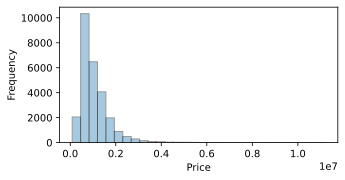

In [24]:
fig, ax = plt.subplots(figsize=(5,2.5))
sns.distplot(df['price'],kde=False,bins=30,hist_kws=dict(edgecolor="k"));
ax.set_xlabel('Price')
ax.set_ylabel('Frequency');
plt.savefig(imageDirectory + '\\price_dist.png', dpi=140,  bbox_inches='tight')

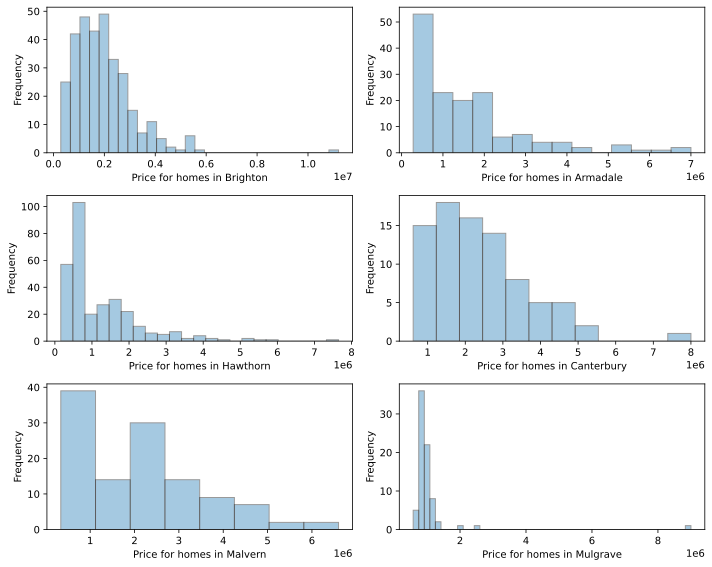

In [25]:
subLst = df.loc[df['price']>6500000, 'suburb'].unique()

fig, axes = plt.subplots(3, 2, figsize=(10, 8))
for sub, ax in zip(subLst, axes.flatten()):
    sns.distplot(df.loc[df['suburb'] == sub, 'price'],kde=False, hist_kws=dict(edgecolor="k"), ax=ax);
    ax.set_xlabel('Price for homes in {}'.format(sub))
    ax.set_ylabel('Frequency');
    
fig.tight_layout()    
plt.savefig(imageDirectory + '\\price_neighbour.png', dpi=140,  bbox_inches='tight')

**Outliers in two suburb:**
- Price histogram in suspected suburbs show that two suburb are likely to have outliers.
- Thy are **Mulgrave and Brighton**
- We will delete the maximum price in these two suburbs.

In [26]:
# making a backup:
df4 = df.copy(deep = True)

#df = df4.copy(deep = True)

In [27]:
index1 = df.loc[df['suburb'] == 'Mulgrave', 'price'].idxmax()
index2 = df.loc[df['suburb'] == 'Brighton', 'price'].idxmax()
removeIndex = [index1, index2]
print(df.shape)
df.drop(removeIndex, axis=0, inplace = True)
print(df.shape)

(27003, 26)
(27001, 26)


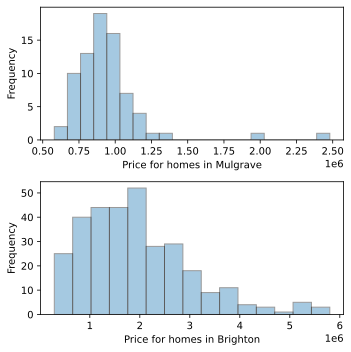

In [28]:
subLst = ['Mulgrave', 'Brighton']
fig, axes = plt.subplots(2, 1, figsize=(5, 5))
for sub, ax in zip(subLst, axes.flatten()):
    sns.distplot(df.loc[df['suburb'] == sub, 'price'],kde=False, hist_kws=dict(edgecolor="k"), ax=ax);
    ax.set_xlabel('Price for homes in {}'.format(sub))
    ax.set_ylabel('Frequency');
    
fig.tight_layout() 
plt.savefig(imageDirectory + '\\price_2neighbour.png', dpi=140,  bbox_inches='tight')

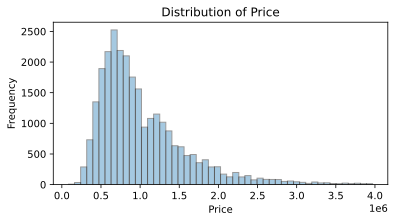

In [29]:
fig, ax = plt.subplots(figsize=(6,3))
sns.distplot(df.loc[df['price']<4000000, 'price'],kde=False, hist_kws=dict(edgecolor="k"));
ax.set_xlabel('Price')
ax.set_ylabel('Frequency');
ax.set_title('Distribution of Price');
plt.savefig(imageDirectory + '\\price_dist2.png', dpi=140,  bbox_inches='tight')

### Price Feature:
- No outlier,
- Skewness to the right side,
- Recommended to treat skewness by applying log transformation.

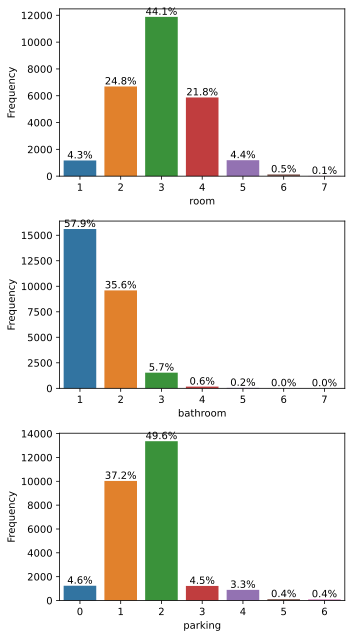

In [30]:
cols = ['room', 'bathroom', 'parking']
make_count_plot(df=df.loc[df['parking']<7], cols=cols, annotate=True, xRotation=0, title=None)
plt.savefig(imageDirectory + '\\ordinal_var2.png', dpi=140,  bbox_inches='tight')

### Insights:
**Number of Rooms:**<br>
    - Most frequency of number of rooms: 3#>2#>4#<br>
    - At the second level, homes have 1 and 5 rooms<br>

**Number of Bathrooms:**<br>
    - Most frequency of number of rooms: 1#>2#>3#<br>
    - At the second level, homes have 3 and 4 bathrooms<br>
    
**Number of parkings:**<br>
    - Most frequency of number of rooms: 2#>1#><br>
    - At the second level, homes have 0, 3, and 4 parkings<br>

In [31]:
df['parking'].value_counts()

2     13366
1     10029
0      1240
3      1220
4       890
5       111
6       102
7        19
8        15
10        5
9         2
11        1
18        1
Name: parking, dtype: int64

In [32]:
df.loc[df['parking']==18]

,suburb,room,type,price,method,seller,date,distance,postcode,bathroom,...,longtitude,region,count,age,year,season,month,period,history,distance_bins
23050,Croydon,2,h,1105000.0,SP,iTRAK,2017-10-28,23.0,3136.0,1,...,145.28695,Eastern Metropolitan,11925,58,2017,Fall,10,2017-10,Old,5


In [33]:
df.loc[(df['suburb']=='Croydon') & (df['landsize']>750), 'parking'].value_counts()

2     24
1     14
3      4
18     1
8      1
Name: parking, dtype: int64

### Odd number of parkings:
- The parking number of 18 is not in harmoby with others,
- While the price of homes are very similar,
- All of them have similar age,
- All of them have similar land size,
- All of them have similar building area,
- We will delete them.

In [34]:
indexLst = df.loc[(df['suburb']=='Croydon') & (df['parking']==18)].index
print(df.shape)
df.drop(indexLst, axis=0, inplace=True)
df.reset_index(inplace=True, drop=True)
print(df.shape)

(27001, 26)
(27000, 26)


In [35]:
df.loc[df['parking'] > 8]

,suburb,room,type,price,method,seller,date,distance,postcode,bathroom,...,longtitude,region,count,age,year,season,month,period,history,distance_bins
4327,Surrey Hills,3,h,2100000.0,VB,Jellis,2017-01-07,10.2,3127.0,1,...,145.10929,Southern Metropolitan,5457,58,2017,Winter,1,2017-01,Old,3
13839,Reservoir,4,h,1112000.0,S,RW,2017-08-26,12.0,3073.0,2,...,145.03086,Northern Metropolitan,21650,33,2017,Summer,8,2017-08,New,3
19342,Hoppers Crossing,3,h,780000.0,SP,Greg,2017-09-12,18.4,3029.0,2,...,144.69513,Western Metropolitan,13830,30,2017,Summer,9,2017-09,New,4
21338,Bayswater,4,h,925000.0,SP,Biggin,2017-06-17,23.2,3153.0,1,...,145.25632,Eastern Metropolitan,5030,52,2017,Spring,6,2017-06,Old,5
21947,Dandenong,3,h,880000.0,S,Barry,2017-07-22,24.7,3175.0,2,...,145.21043,South-Eastern Metropolitan,10894,58,2017,Summer,7,2017-07,Old,5
23559,Camberwell,4,h,2000000.0,PI,RT,2018-03-17,7.7,3124.0,3,...,145.08812,Southern Metropolitan,8920,98,2018,Winter,3,2018-03,Old,2
24225,St Albans,4,h,788000.0,S,Ray,2018-02-17,14.0,3021.0,2,...,144.80179,Western Metropolitan,14042,58,2018,Winter,2,2018-02,Old,3
25868,Sunshine West,5,h,990000.0,PI,Douglas,2018-06-01,10.5,3020.0,2,...,144.81960,Western Metropolitan,6763,43,2018,Spring,6,2018-06,New,3


### Insights:
- All of them are house,
- The landsize of all records are large enough to support these amount of parking,
- We will keep them.

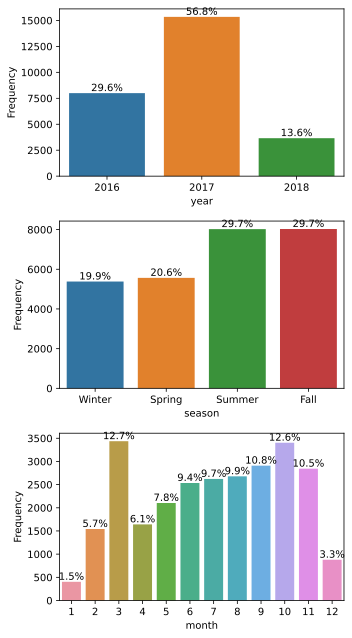

In [36]:
cols = ['year', 'season', 'month']
make_count_plot(df, cols=cols, annotate=True, xRotation=0, title=None)
plt.savefig(imageDirectory + '\\date_var.png', dpi=140,  bbox_inches='tight')

### Insights:
- Maximum records are for year 2017,
- Sales in Fall and Summer are much more than Winter and Spring
- Most records happne in months March and October
- January and December are two months with minimum records.

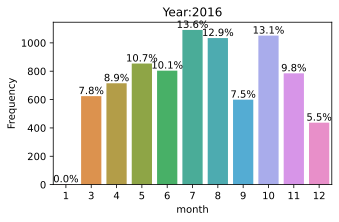

In [37]:
make_count_plot(df.loc[df['year']==2016], cols=['month'], annotate=True, xRotation=0, title='Year:2016')
plt.savefig(imageDirectory + '\\month_2016.png', dpi=140,  bbox_inches='tight')

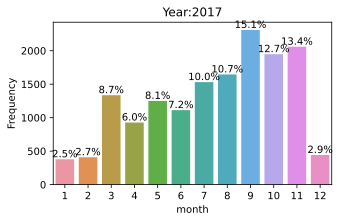

In [38]:
make_count_plot(df.loc[df['year']==2017], cols=['month'], annotate=True, xRotation=0, title='Year:2017')
plt.savefig(imageDirectory + '\\month_2017.png', dpi=140,  bbox_inches='tight')

### Home sales in 2016 and 2017:
- Home sales in terms of frequency are different in 2016 and 2017.
- Maximum frequency in 2016 are for months: July, August, October 
- Maximum frequency in 2017 are for months: September, October, November.
- In both years,there are few sale in December and January.

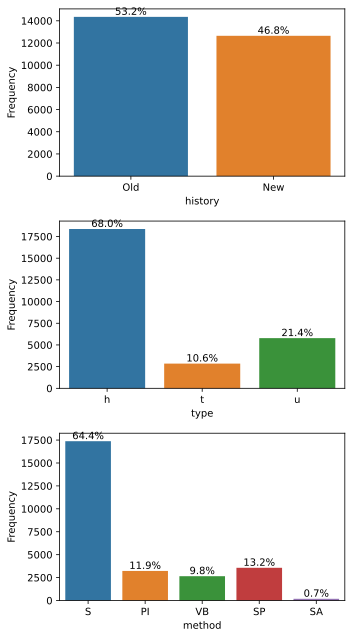

In [39]:
cols = ['history', 'type', 'method']
make_count_plot(df, cols=cols, annotate=True, xRotation=0, title=None)
plt.savefig(imageDirectory + '\\ordinal_3.png', dpi=140,  bbox_inches='tight')

### Insights:
- **Are homes more than 50 years?**
    - With an indicator of 50 years, almost one half of records are new and one half is old,
- **Home Types:**
    - In terms of type of records, count of house are three times more than units.
- **Sell format:**
    - More than 64% of homes are regularly sold,
    - We also have three different formats which each one approximately includes 10% of the dataset:
        - Property passed in,
        - Vendor bid,
        - Property sold prior.

### Simplifying region name for reading purposes:
- Metropolitan: Metro
- Victoria: Vic
- Northern: N
- Southern: S
- Eastern: E
- Western: W
- South-Eastern: SE

In [40]:
df['region'].replace({'Southern Metropolitan':'S_Metro',
                      'Northern Metropolitan':'N_Metro',
                      'Western Metropolitan':'W_Metro',
                      'Eastern Metropolitan':'E_Metro',
                      'South-Eastern Metropolitan':'SE_Metro',
                      'Eastern Victoria':'E_Vic',
                      'Northern Victoria':'N_Vic',
                      'Western Victoria':'W_Vic'}, inplace=True)

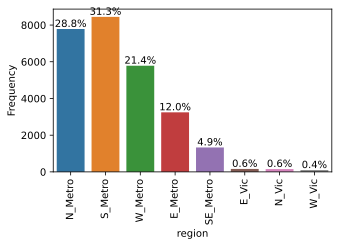

In [41]:
make_count_plot(df, cols=['region'], annotate=True, xRotation=90, title=None)
plt.savefig(imageDirectory + '\\region.png', dpi=140,  bbox_inches='tight')

**Region:**
- Vast majority of homes are located in metropolitan regions. In metropolitan:
    - The most frequency is in Southern and Northern;
    - The less frequency is in Western, Eastern, and South-Eastern.
- Only less than 2 precentage of records are located in Victoria regions.

**How many councilarea are located in each region?**

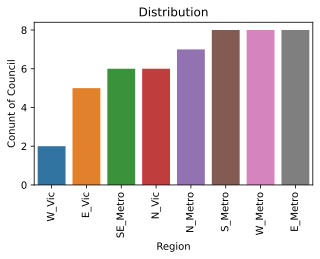

In [42]:
region_df = pd.DataFrame(columns = {'region', 'councilCnt'})

regionLst = df['region'].unique()
councilLst = [df.loc[df['region']==x, 'councilarea'].nunique() for x in regionLst]

region_df = pd.DataFrame({'region':regionLst, 'councilCnt':councilLst})
region_df.sort_values(by=['councilCnt'], ignore_index = True, inplace=True)


#sns.barplot(region_df['region'], region_df['councilCnt'])
make_bar_plot(x=region_df['region'], y=region_df['councilCnt'], xLabel='Region', yLabel='Conunt of Council', xRotation=90)
plt.savefig(imageDirectory + '\\region_council.png', dpi=140,  bbox_inches='tight')

**Insights:**
- Regions with maximum councilarea:
    - Eastern, Western, Southern Metropolitan
- Regions with minimum councilarea:
    - Western Victoria

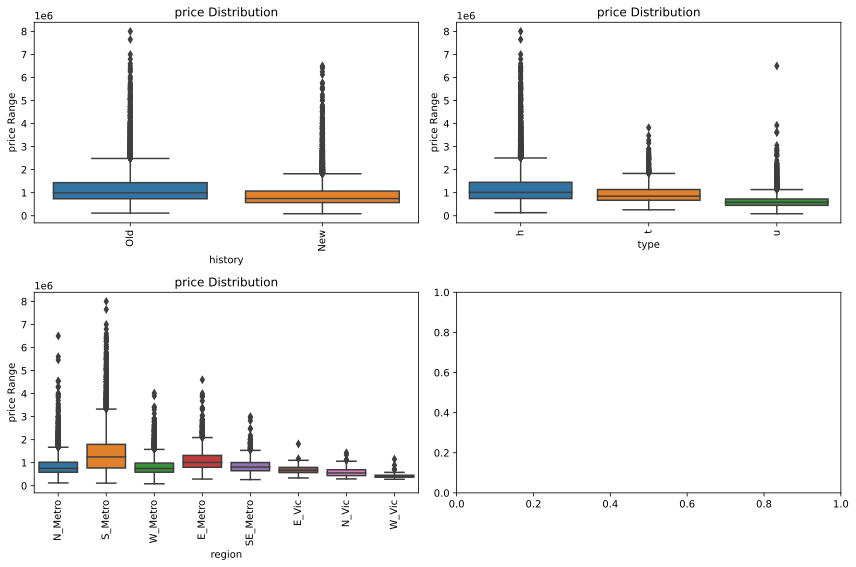

In [43]:
cols = ['history', 'type', 'region']#, 'year', 'season', 'month']
make_binarybox_plot(df, cols=cols, target='price', xRotation=45)

### Price:
- **Home types:**
    - One of the indicator for price may be home type. For example type h: House and cottage are more expensive than others. 
- **Region:**
    - Generally: Metropolitan is more expensive than Victoria.
    - The most expensive region is Southern Metropolitan.
- **History:**
    - Old homes cost more than new ones.
    - This needs more analysis.
    - Probably old home are bigger and because of that they are expensive,
    - Or maybe, they are located closer to business center.

(2015.0, 2020.0)

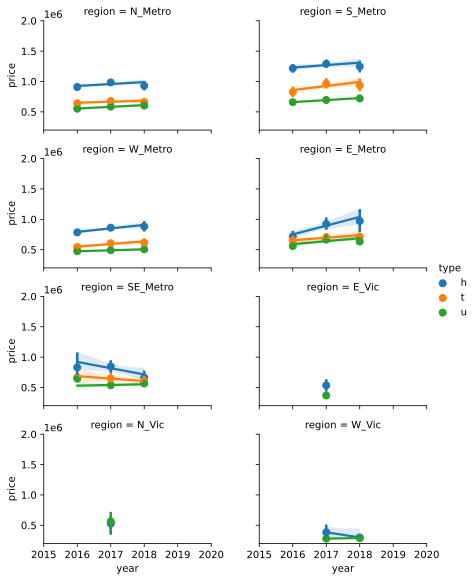

In [44]:
sns.lmplot(x="year", y="price",hue="type", data=df.loc[df['room']==2], col='region', x_estimator=np.mean,col_wrap=2, size=2, aspect=1.5)
plt.ylim(200000, 2000000)
plt.xlim(2015,2020)

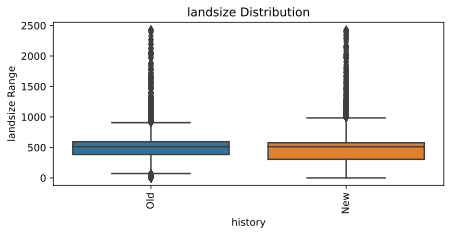

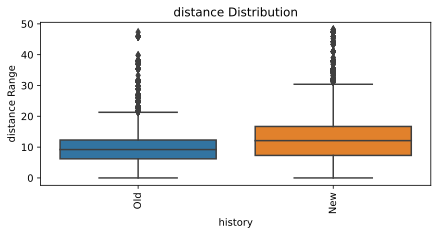

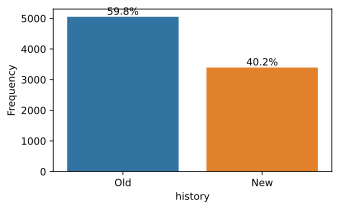

In [45]:
make_binarybox_plot(df, cols=['history'], target='landsize', xRotation=45)
make_binarybox_plot(df, cols=['history'], target='distance', xRotation=45)
make_count_plot(df=df.loc[df['region'] == 'S_Metro'], cols=['history'], annotate=True)

plt.savefig(imageDirectory + '\\ordinal_4.png', dpi=140,  bbox_inches='tight')

### Old homes vs New ones:
- In term of **landsize** they are quite comparable.
- In term of **Distance from city center** old homes are closer to city center. That is one of the reason why they are more expensive. 
- In the most expensive region of the city, 60 % of the homes are old ones.

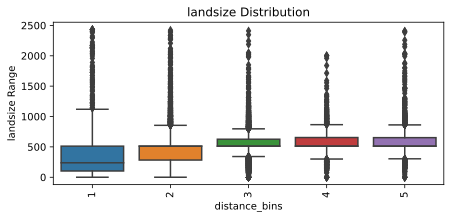

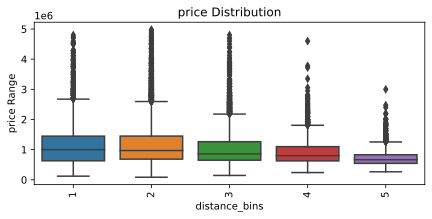

In [46]:
make_binarybox_plot(df, cols=['distance_bins'], target='landsize', xRotation=45)
make_binarybox_plot(df.loc[df['price']<5000000], cols=['distance_bins'], target='price', xRotation=45)

### Insights:
- The closer to the city center, the smaller the landsize,
- The closer to the city center, the higher the cost.

In [47]:
df.groupby('period')['price'].sum().to_frame()


,price
period,
2016-01,2.018000e+06
2016-03,7.359026e+08
2016-04,7.282490e+08
2016-05,8.876650e+08
2016-06,8.258232e+08
2016-07,1.073006e+09
2016-08,1.072780e+09
2016-09,6.175876e+08
2016-10,1.180203e+09


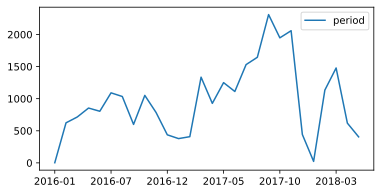

In [48]:
# Question: Count of transaction based on period(a combiniation of year and month)
period_df = df['period'].value_counts().to_frame()
period_df.sort_index(inplace=True)

fig, ax = plt.subplots(figsize=(6, 3))
period_df.plot(ax=ax);

In [49]:
room1Lst = df.loc[df['room']==1].groupby('period')['price'].mean().values#.to_frame()
room2Lst = df.loc[df['room']==2].groupby('period')['price'].mean().values#.to_frame()
room3Lst = df.loc[df['room']==3].groupby('period')['price'].mean().values#.to_frame()
print(len(room1Lst))
print(len(room2Lst))
print(len(room3Lst))

27
28
28


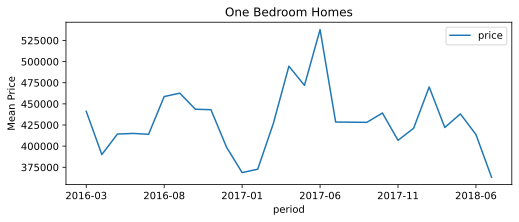

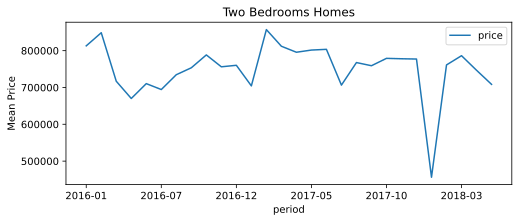

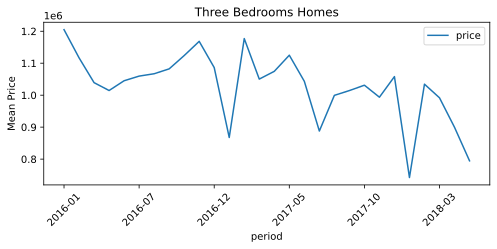

In [50]:
#use groupby to compute the price for each available month, then store the result in a dataframe
period_df1= df.loc[df['room']==1].groupby('period')['price'].mean().to_frame()
period_df2= df.loc[df['room']==2].groupby('period')['price'].mean().to_frame()
period_df3= df.loc[df['room']==3].groupby('period')['price'].mean().to_frame()


fig, ax = plt.subplots(figsize=(8,3))
period_df1.plot(ax=ax, rot=0);
ax.set_ylabel('Mean Price');
ax.set_title('One Bedroom Homes');

fig, ax = plt.subplots(figsize=(8,3))
period_df2.plot(ax=ax, rot=0)
ax.set_ylabel('Mean Price');
ax.set_title('Two Bedrooms Homes');


fig, ax = plt.subplots(figsize=(8,3))
period_df3.plot(ax=ax, rot=45)
ax.set_ylabel('Mean Price');
ax.set_title('Three Bedrooms Homes');

### Time Series vs Home Price
- The price trend of one bed room homes are some how different from two and three bedrooms.
- **Number of room** definitely plays an important role in final price and even its variation over time. 
- For instance, in second half of 2016, trend is decreasing for one bedroom, while for 2 and 3 bedroom are increasing.
- Period with maximum price for one bedroom is July 2017.
- Period with maximum price for two and three bedrooms are February 2017.

In [51]:
# Making a backup:
df6 = df.copy(deep=True)

# df = df6.copy(deep=True)

### Growth Rate per Region and Home Type from 2016 to 2017:

In [52]:
# Victoria regions do not have data for year 2018.
# So, we will ignore them.

selected_df = df.loc[(df['year']!=2018) &
                     (df['region']!= 'E_Vic') &
                     (df['region']!= 'N_Vic') &
                     (df['region']!= 'W_Vic')]
temp_df=selected_df.groupby(['year','region','type'],as_index=False)['price'].count()
temp_df = temp_df.sort_values(['region', 'type','year'])
temp_df.reset_index(inplace=True, drop=True)
temp_df.rename(columns={'price':'count'}, inplace=True)
temp_df.head(6)

,year,region,type,count
0,2016,E_Metro,h,452
1,2017,E_Metro,h,1685
2,2016,E_Metro,t,56
3,2017,E_Metro,t,187
4,2016,E_Metro,u,100
5,2017,E_Metro,u,254


In [53]:
length = temp_df.shape[0]
count = int(length/2)
growthLst = [0]*(count)
regionLst = [0]*(count)
typeLst = [0]*(count)

for i in range(0, count):
    growthLst[i] = round(100*temp_df.loc[2*i+1, 'count']/temp_df.loc[2*i, 'count'],2)
    regionLst[i] = temp_df.loc[2*i, 'region']
    typeLst[i] = temp_df.loc[2*i, 'type']

growth_df = pd.DataFrame(columns = ['region', 'type', 'growthRate'])
growth_df['region'] = regionLst
growth_df['type'] = typeLst
growth_df['growthRate'] = growthLst
growth_df.head(3)

,region,type,growthRate
0,E_Metro,h,372.79
1,E_Metro,t,333.93
2,E_Metro,u,254.00


### Find top 10 growth rate by region and type:

In [54]:
growth_df.sort_values(by='growthRate', ascending=False)[:10]

,region,type,growthRate
8,SE_Metro,u,3775.00
7,SE_Metro,t,2150.00
6,SE_Metro,h,2102.63
0,E_Metro,h,372.79
1,E_Metro,t,333.93
2,E_Metro,u,254.00
12,W_Metro,h,201.59
3,N_Metro,h,200.73
4,N_Metro,t,170.55
10,S_Metro,t,157.73


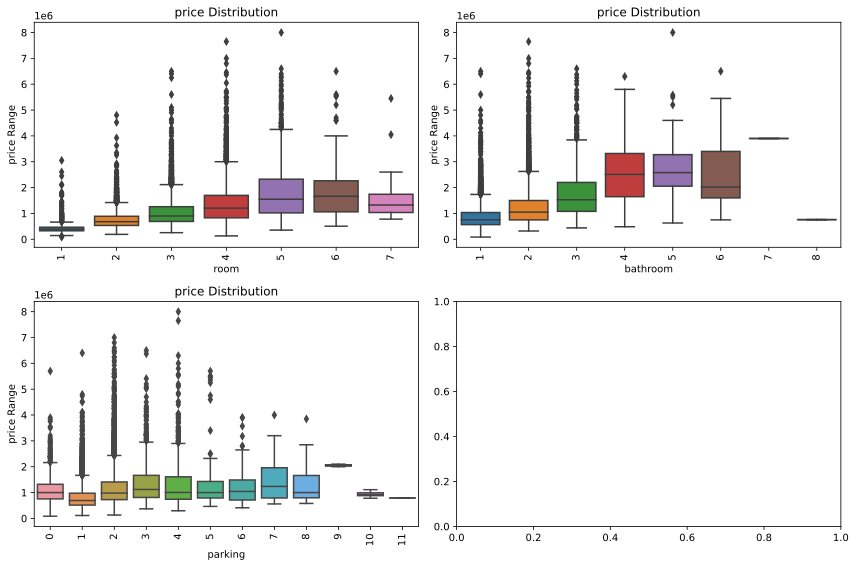

In [55]:
cols = ['room', 'bathroom', 'parking']
make_binarybox_plot(df, cols=cols, target='price', xRotation=45)

### Insights:
- **Room and Bathroom:**
    - Cost of home logically has direct relation with cont of room and bathroom.
- **Parking:**
    - While, it is not the same trend for number of parking. 

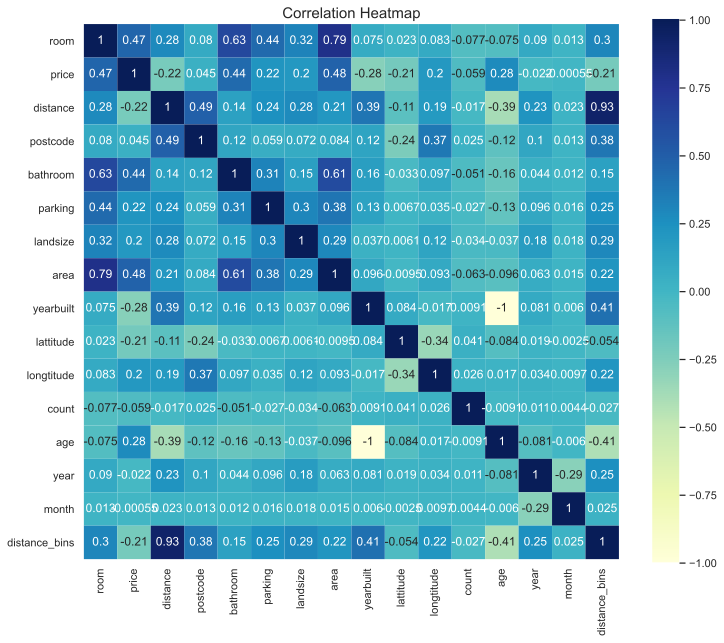

In [56]:
cols = df.columns.to_list()
makeHeatmap(df=df, cols=cols, annot = True, line=False)

### Insights:
- Positive correlated features with price:
    - Room, bathroom, building area
- Negative correlated features with price:
    - Distance, yearbuilt
- Highly correlated features:
    - room and area,
    - room and bathroom,
    - bathroom and area
    - distance and distance_bins

In [57]:
# making a backup:
df8 = df.copy(deep=True)

#df = df8.copy(deep=True)

In [58]:
# Droping some features:
# Count feature just says that how many homes we have in each region. not helpful for price prediction.
# yearbuilt: We have calculated the old of homes. We do not need yearbuilt anymore.
# date: We have already extracted year, month, season, period. We can drop date.
# distance_bin: We use distance directly.

removeLst = ['distance_bins', 'yearbuilt', 'date', 'count']
print(df.shape)
df.drop(removeLst, axis=1, inplace=True)
df.reset_index(inplace=True, drop=True)
print(df.shape)

(27000, 26)
(27000, 22)


In [59]:
metadata = make_metadata(df)

catFeatures, catCnt, cat_df = make_typedf(df, metadata, 'categorical')
ordFeatures, ordCnt, ord_df = make_typedf(df, metadata, 'ordinal')
numFeatures, numCnt, num_df = make_typedf(df, metadata, 'numeric')
binFeatures, binCnt, bin_df = make_typedf(df, metadata, 'binary')

metadata

,role,type,dtype,uniqueCnt
varname,,,,
suburb,input,categorical,object,337
room,input,ordinal,int64,7
type,input,categorical,object,3
price,input,numeric,float64,2860
method,input,categorical,object,5
seller,input,categorical,object,349
distance,input,numeric,float64,212
postcode,input,numeric,float64,207
bathroom,input,ordinal,int64,8


In [60]:
fig, ax = plt.subplots(figsize=(5,5))
df.plot(kind="scatter",
        x="longtitude",
        y="lattitude",
        alpha=0.4,
        c=df.price,
        cmap=plt.get_cmap("jet"),
        label= 'Price by location',
        ax=ax) 

plt.ylabel("Latitude", fontsize=14)
plt.xlabel("Longtitude", fontsize=14)
plt.legend(fontsize=14);

In [61]:
# A better ontrast is possible by reducing too expensive prices:
selected_df = df.loc[df['price']<3000000]


In [62]:
# A better ontrast is possible by reducing too expensive prices:
selected_df = df.loc[df['price']<3000000]
fig, ax = plt.subplots(figsize=(9,6))
selected_df.plot(kind="scatter",
        x="longtitude",
        y="lattitude",
        alpha=0.4,
        c=selected_df.price,
        cmap=plt.get_cmap("jet"),
        label= 'Price by location',
        ax=ax) 

plt.ylabel("Latitude", fontsize=14)
plt.xlabel("Longtitude", fontsize=14)
plt.legend(fontsize=14);

plt.savefig(imageDirectory + '\\latitude_lngtitude.png', dpi=140,  bbox_inches='tight')

### Insights:
It is clear that the colser to the business center, the more expensive the homes.

In [63]:
df.head(1)

,suburb,room,type,price,method,seller,distance,postcode,bathroom,parking,...,councilarea,lattitude,longtitude,region,age,year,season,month,period,history
0,Abbotsford,2,h,1480000.0,S,Biggin,2.5,3067.0,1,1,...,Yarra City Council,-37.7996,144.9984,N_Metro,118,2016,Winter,3,2016-03,Old


In [64]:
df.head(2)

,suburb,room,type,price,method,seller,distance,postcode,bathroom,parking,...,councilarea,lattitude,longtitude,region,age,year,season,month,period,history
0,Abbotsford,2,h,1480000.0,S,Biggin,2.5,3067.0,1,1,...,Yarra City Council,-37.7996,144.9984,N_Metro,118,2016,Winter,3,2016-03,Old
1,Abbotsford,2,h,1035000.0,S,Biggin,2.5,3067.0,1,0,...,Yarra City Council,-37.8079,144.9934,N_Metro,118,2016,Spring,4,2016-04,Old


In [65]:
# making a backup:
df9 = df.copy(deep=True)

#df = df9.copy(deep=True)

### Log transformation on target feature:
- Due to large range of home price plus the right side skewness, it is recommended to apply a log transformation.
- In that case we will reduce the impact of large numbers and the model will be affeted uniformly from different home price.

In [66]:
df['price'] = np.log(df['price'])

**Exporting dataset for future using:**

In [67]:
df.to_csv(dataDirectory + "\Melbourne_Tohid_Final.csv", index=False)